In [ ]:
!pip install Unidecode
!pip install fuzzysearch

!pip install elementpath
!pip install lxml 
!pip install graphviz
!pip install pydotplus

In [1]:
!ls ../../edspdf-train/data/publaynet/

dev.json xmls


# Sorting lines based on the xml files

In [2]:
from sort_xml import *
base_dir = '../../edspdf-train/data/publaynet/'

%load_ext autoreload
%autoreload 2

import sys
sys.executable

'/Users/souleymbaye/opt/anaconda3/envs/eds_env/bin/python'

### Load pdf and xml example 

In [359]:
!ls ../../edspdf-train/data/publaynet/xmls | wc -l

     101


In [4]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1247517/

ehp0112-001282.nxml  ehp0112-001282e2.jpg ehp0112-001282f2.gif
ehp0112-001282.pdf   ehp0112-001282f1.gif ehp0112-001282f2.jpg
ehp0112-001282e1.jpg ehp0112-001282f1.jpg


In [ ]:
PMC1247562 # exellent
PMC1247569 # exell b-37
PMC1247570 # title twice b-16, b-23
PMC1247573 # ordre dans table match
PMC1247606 # b-8 vp b-9 vp missing in the xml
PMC1247607 # end--start b-17
PMC1247608

In [340]:
file_dir = base_dir + 'xmls/PMC1247616'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')


xml path: ../../edspdf-train/data/publaynet/xmls/PMC1247616/ehp0112-001519.nxml
pdf path: ../../edspdf-train/data/publaynet/xmls/PMC1247616/ehp0112-001519.pdf


## Model extractor

In [341]:
from edspdf import Pipeline
from edspdf.structures import Box, PDFDoc
from edspdf.visualization.annotations import show_annotations

# model
model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

# Read PDF
pdf = pdf_path.read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

dict_page_text_boxes = {}
for tb in doc.content_boxes:
    if tb.page_num not in dict_page_text_boxes:
        dict_page_text_boxes[tb.page_num] = []
    dict_page_text_boxes[tb.page_num].append(tb)

# pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

#### Display XML

In [342]:
# Read XML
xml = open(xml_path, 'rb')
tree = etree.parse(xml)
# root = tree.getroot()

printXML(tree)

<!DOCTYPE article PUBLIC "-//NLM//DTD JATS (Z39.96) Journal Archiving and Interchange DTD v1.0 20120330//EN" "JATS-archivearticle1.dtd">
<article xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML" article-type="research-article">
  <?properties open_access?>
  <front>
    <journal-meta>
      <journal-id journal-id-type="nlm-ta">Environ Health Perspect</journal-id>
      <journal-id journal-id-type="iso-abbrev">Environ. Health Perspect</journal-id>
      <journal-title-group>
        <journal-title>Environmental Health Perspectives</journal-title>
      </journal-title-group>
      <issn pub-type="ppub">0091-6765</issn>
      <issn pub-type="epub">1552-9924</issn>
      <publisher>
        <publisher-name>National Institue of Environmental Health Sciences</publisher-name>
      </publisher>
    </journal-meta>
    <article-meta>
      <article-id pub-id-type="pmid">15531437</article-id>
      <article-id pub-id-type="pmc">1247616</article-id>
    

#### Font, Body and tables text nodes

##### Front nodes matching

In [343]:
xml_front_nodes = get_front_nodes(tree)

print(f'\n\nNb nodes {len(xml_front_nodes)}')
for id,xml_node in enumerate(xml_front_nodes):
    printXML(xml_node)

front_nodes = []
for id,xml_node in enumerate(xml_front_nodes):
    node = Node(xml_node, id, color='yellow', bg_color='black', r0='f')
    front_nodes.append(node)
    
front_nodes = tqdm(front_nodes, mininterval=1)



Nb nodes 5
<article-title xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML">Impact of the Phytoestrogen Content of Laboratory Animal Feed on the Gene Expression Profile of the Reproductive System in the Immature Female Rat</article-title>

<contrib-groups>
  <new-name>
    <given-names>Jorge M.</given-names>
    <surname>Naciff</surname>
  </new-name>
  <new-name>
    <given-names>Gary J.</given-names>
    <surname>Overmann</surname>
  </new-name>
  <new-name>
    <given-names>Suzanne M.</given-names>
    <surname>Torontali</surname>
  </new-name>
  <new-name>
    <given-names>Gregory J.</given-names>
    <surname>Carr</surname>
  </new-name>
  <new-name>
    <given-names>Jay P.</given-names>
    <surname>Tiesman</surname>
  </new-name>
  <new-name>
    <given-names>George P.</given-names>
    <surname>Daston</surname>
  </new-name>
</contrib-groups>

<affs>
  <aff>Miami Valley Laboratories, The Procter and Gamble Company, Cincinnati, Ohio, USA

In [344]:
for tb in doc.content_boxes:
    tb.rank = None
    tb.inode = None

In [345]:
for node in front_nodes:
    node.reset()

get_matches(front_nodes, dict_page_text_boxes, v=False)

100%|██████████| 5/5 [00:03<00:00,  1.44it/s]


In [346]:
n_tt = len(front_nodes)
n_mt = len([0 for node in front_nodes if node.full])
print(f'Front\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in front_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Front
  Nb nodes total 5
  Nb nodes matched 4
  Nb nodes not matched 1
    4  `The effect of the dietary background of phytoestrogens on the outcome of rodent bioassays used to identify and assess the reproductive hazard of endocrine-disrupting chemicals is controversial. Phytoestrogens, including genistein, daidzein, and coumestrol, are fairly abundant in soybeans and alfalfa, common ingredients of laboratory animal diets. These compounds are weak agonists for the estrogen receptor (ER) and, when administered at sufficient doses, elicit an estrogenic response  in vivo . In this study, we assessed the potential estrogenic effects of dietary phytoestrogens at the gene expression level, together with traditional biologic end points, using estrogen-responsive tissues of the immature female rat. We compared the gene expression profile of the uterus and ovaries, as a pool, obtained using a uterotrophic assay protocol, from intact prepubertal rats fed a casein-based diet (free from soy and a

In [347]:
id = 2
for node in front_nodes:
    if node.id == id:
        break

node.print_node()

Nb blocs 2
Node (2 complete) text: `Miami Valley Laboratories, The Procter and Gamble Company, Cincinnati, Ohio, USA`
complete bloc
  Nb tbs 1
  Text: `Miami Valley Laboratories, The Procter and Gamble Company, Cincinnati, Ohio, USA`
     0 p-0 `Miami Valley Laboratories, The Procter and Gamble Company, Cincinnati, Ohio, USA` 		-> [Match(start=0, end=70, dist=0, matched='MiamiValleyLaboratories,TheProcterandGambleCompany,Cincinnati,Ohio,USA')] TextBox(x0=0.0784313725490196, x1=0.602785620915032, y0=0.14537537878787876, y1=0.15547638888888882, label=None, page_num=0, text='Miami Valley Laboratories, The Procter and Gamble Company, Cincinnati, Ohio, USA', props=[TextProperties(italic=False, bold=False, begin=0, end=80, fontname='MNMPAO+Univers')])


##### Body nodes matching

In [348]:
# executer une seule fois sionon erreur
# moins de noeuds retournes

qbody='//body//title | //body//p'
r = elementpath.select(tree, qbody)
r2 = []

jump = False
for i,node in enumerate(r):
    if jump:
        jump = False
        continue
    if node.tag == 'title' and r[1+i].tag == 'p':
        sec = etree.Element('sec')
        sec.append(node)
        sec.append(r[1+i])
        r2.append(sec)
        jump = True
    else:
        r2.append(node)

xml_body_nodes = r2

body_nodes = []
for id, xml_node in enumerate(xml_body_nodes):
    node = Node(xml_node, id, color='black', bg_color='cyan', r0='b')
    body_nodes.append(node)
body_nodes = tqdm(body_nodes, mininterval=1)

In [349]:
len(r2) # should be 32

24

In [350]:
for node in body_nodes:
    node.reset()

get_matches(body_nodes, dict_page_text_boxes, v=False)

100%|██████████| 24/24 [00:13<00:00,  1.83it/s]


In [351]:
n_tt = len(body_nodes)
n_mt = len([0 for node in body_nodes if node.full])
print(f'Body\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in body_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Body
  Nb nodes total 24
  Nb nodes matched 24
  Nb nodes not matched 0


In [313]:
inode_copy = []
for tb in doc.content_boxes:
    inode_copy.append(tb.inode)

In [336]:
id = 22
for node in body_nodes:
    if node.id == id:break
node.print_node()

Nb blocs 179
Node (22 not complete) text: `Sex hormone activity distribution in Singapore's green mussels. The AR activity of mussel extract alone was very low in samples from all locations (< 1% of 0.1 nM DHT). However, the samples displayed a strong increase in activity in the presence of 0.1 nM DHT, with clear geographical variation, indicating a synergistic response of the mussel extract in the presence of the reference androgenic hormone. The highest increases in AR endocrine activities were found at sample locations close to ship maintenance yards or industrial areas (i.e., stations M4, M3, and M8). The lowest increases in AR activities were found in  P. viridis  samples taken from stations M2 and M6. These sites are adjacent to fish and bivalve aquaculture farms located in the middle of the West and East Straits of Johore and are not directly exposed to industrial and shipping activity.`
bloc 0
  Nb tbs 1
  Text: `Singapore`
     0 p-1 `Singapore` 		-> [Match(start=32, end=41, d

##### Tables nodes matching

In [352]:
# one execution

qtables='//table-wrap'
tables_nodes=elementpath.select(tree, qtables)


qtable='//label | //caption | //tr | //table-wrap-foot'
xml_table_nodes = [
    [
        node for node in one_tns if "".join(node.itertext()) != ""
    ]
    for one_tns in [elementpath.select(table_tree, qtable) for table_tree in tables_nodes]
]

# Merging label and caption
for itable in range(len(xml_table_nodes)):
    label = None
    caption = None
    lc = None
    for ind,node in enumerate(xml_table_nodes[itable]):
        if node.tag == 'label':
            label = (ind,node)
        if node.tag == 'caption':
            caption = (ind,node)
        if label is not None and caption is not None:
            lc = etree.Element('label_caption')
            lc.append(deepcopy(label[1]))
            lc.append(deepcopy(caption[1]))
            xml_table_nodes[itable][label[0]] = lc
            xml_table_nodes[itable] = xml_table_nodes[itable][:caption[0]] + xml_table_nodes[itable][1+caption[0]:]
            break

# delete other label tags
table_nodes_ = []
for table in xml_table_nodes:
    tk_nodes = []
    for node in table:
        if node.tag != 'label':
            tk_nodes.append(node)
    table_nodes_.append(tk_nodes)
    
xml_table_nodes = table_nodes_

table_nodes = []
for itable,xml_t in enumerate(xml_table_nodes):
    t_nodes = []
    for id,xml_node in enumerate(xml_t):
        node = Node(xml_node, id, color='red', bg_color='white', r0=f't{itable}-')
        t_nodes.append(node)
    t_nodes = tqdm(t_nodes, mininterval=1)
    table_nodes.append(t_nodes)

In [201]:
itable = 0
print(f'Nb nodes of table {itable}: {len(xml_table_nodes[itable])}\n')
for inode,node in enumerate(xml_table_nodes[itable]):
    print(f'{node.tag} {inode}\n  `{" | ".join(node.itertext())}`\n')
    # printXML(node)
    print('------------------')

Nb nodes of table 0: 5

label_caption 0
  `Table 1 | Summary of levels of hierarchical model.`

------------------
tr 1
  `Level | Data | Modeling techniques | Modeled process`

------------------
tr 2
  `1 | Meteorology ambient monitor | Spatial statistical model | Spatial surface of ambient PM | 2.5 |  levels`

------------------
tr 3
  `2 | Demographics activity patterns | Exposure simulator | Population exposure levels`

------------------
tr 4
  `3 | Mortality confounders | Poisson GAM | Cardiovascular mortality`

------------------


In [353]:

# for ic,tb in zip(inode_copy,doc.content_boxes):
#     tb.inode = ic
for t_nodes in table_nodes:
    for node in t_nodes:
        node.reset()
    
    get_matches(t_nodes, dict_page_text_boxes, v=False)

# itable = 0
# _tdb = get_matches(table_nodes[itable], dict_page_text_boxes, color='red', bg_color='white',v=False, r0=f't{itable}-')

100%|██████████| 11/11 [00:03<00:00,  2.94it/s]

100%|██████████| 12/12 [00:03<00:00,  3.07it/s]


100%|██████████| 31/31 [00:04<00:00,  7.12it/s]



100%|██████████| 93/93 [00:05<00:00, 17.28it/s]




100%|██████████| 7/7 [00:12<00:00,  1.75s/it]


In [354]:
print(f'Nb tables {len(table_nodes)}')
for itable in range(len(table_nodes)):
    # itable = 0
    
    tk_nodes = table_nodes[itable]
    # tk_nodes_blocs, tk_dict_blocs = _tdb    #   table_dict_blocks[itable]

    n_tt = len(tk_nodes)
    n_mt = len([0 for node in tk_nodes if node.full])
    print(f'Table {itable}\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
    for node in tk_nodes:
        if not node.full:
            print(f'    {node.id}  `{node.text}`')
    
    # break

Nb tables 5
Table 0
  Nb nodes total 11
  Nb nodes matched 11
  Nb nodes not matched 0
Table 1
  Nb nodes total 12
  Nb nodes matched 9
  Nb nodes not matched 3
    2  `Body weight (g) Ovarian weight (mg) Uterine weight (mg) Epithelial cell height (mm) Body weight (g) Ovarian weight (mg) Uterine weight (mg) Epithelial cell height (mm)`
    5  ` Mean +- SD (relative) a 0.50 +- 0.04 0.58 +- 0.04 0.49 +- 0.07 0.56 +- 0.08`
    9  ` Mean +- SD (relative) a 0.52 +- 0.1 0.93 +- 0.1 0.52 +- 0.1 0.93 +- 0.2`
Table 2
  Nb nodes total 31
  Nb nodes matched 31
  Nb nodes not matched 0
Table 3
  Nb nodes total 93
  Nb nodes matched 75
  Nb nodes not matched 18
    14  `M88469 f -Spondin Sponf 1.7 1.7 1.1`
    15  `X66845 Dynein, cytoplasmic, intermediate chain 1 Dncic1 A A A`
    30  `AF083269 Actin-related protein complex 1b Arpc1b 1.0 1.3 -1.0`
    31  `AA891760 EST195563  Rattus norvegicus A A A`
    34  `X07467 Glucose-6-phosphate dehydrogenase G6pd 1.2 1.2 -1.1`
    36  `AA891542 EST195345  R

In [357]:
# inode never matched fails because therefore inode not in _dict_blocs
itable = 1
id = 2
tk_nodes = table_nodes[itable]

# tk_nodes_blocs, tk_dict_blocs = _tdb    #  table_dict_blocks[itable]# 
for node in tk_nodes:
    if node.id == id: break

node.print_node()

Nb blocs 8
Node (2 not complete) text: `Body weight (g) Ovarian weight (mg) Uterine weight (mg) Epithelial cell height (mm) Body weight (g) Ovarian weight (mg) Uterine weight (mg) Epithelial cell height (mm)`
bloc 0
  Nb tbs 3
  Text: `Body - weight - (g)`
     0 p-2 `Body` 		-> [Match(start=0, end=4, dist=0, matched='Body')] TextBox(x0=0.23021699346405233, x1=0.2534418300653595, y0=0.7310651515151515, y1=0.7411661616161616, label=None, page_num=2, text='Body', props=[TextProperties(italic=False, bold=False, begin=0, end=4, fontname='MNMPOP+Univers-CondensedLight')])
     1 p-2 `weight` 		-> [Match(start=4, end=10, dist=0, matched='weight')] TextBox(x0=0.22550065359477126, x1=0.2581607843137255, y0=0.7424287878787879, y1=0.7525297979797979, label=None, page_num=2, text='weight', props=[TextProperties(italic=False, bold=False, begin=0, end=6, fontname='MNMPOP+Univers-CondensedLight')])
     2 p-2 `(g)` 		-> [Match(start=10, end=13, dist=0, matched='(g)')] TextBox(x0=0.23602810457516338,

#### Ranked text boxes

In [40]:
# doc.content_boxes[:10]

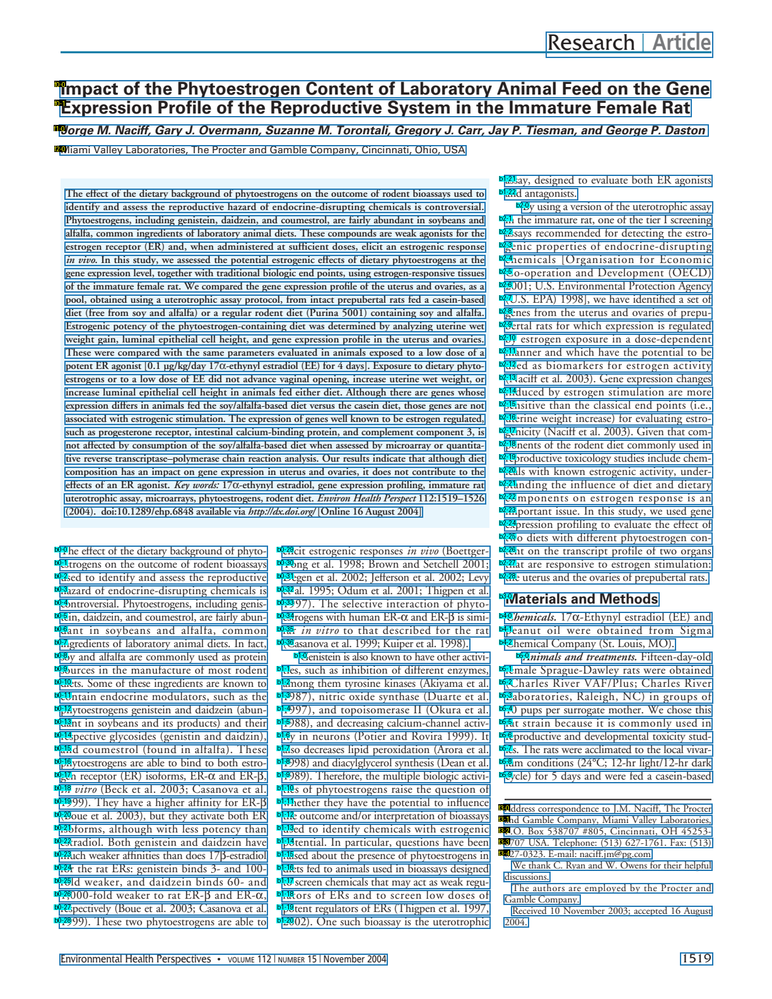

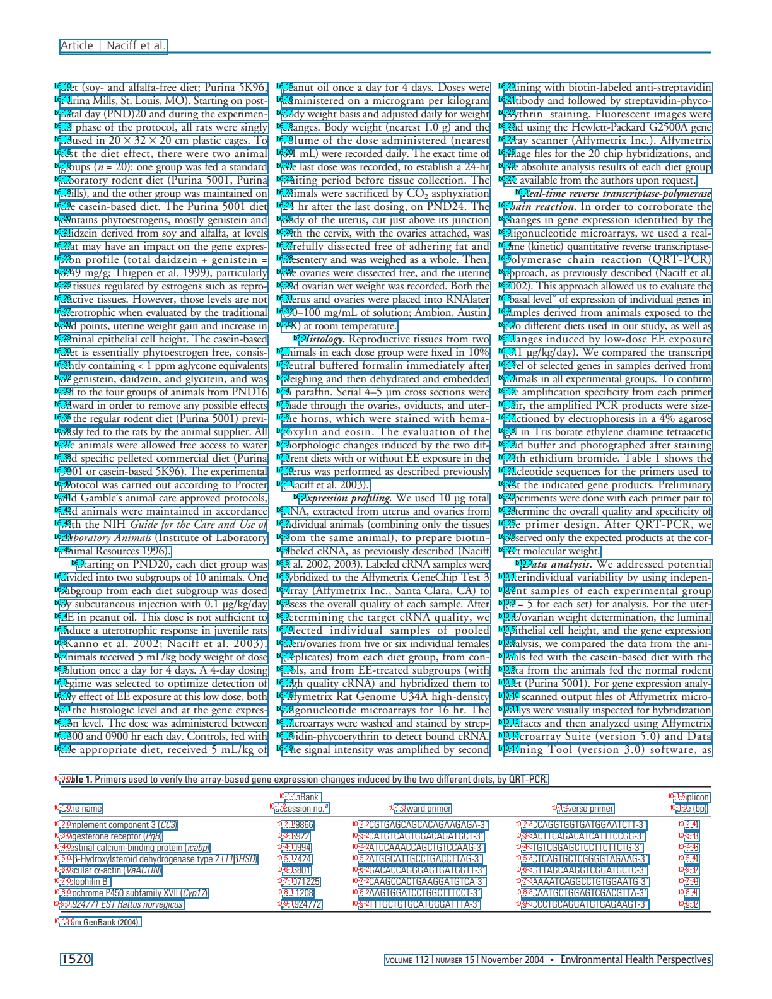

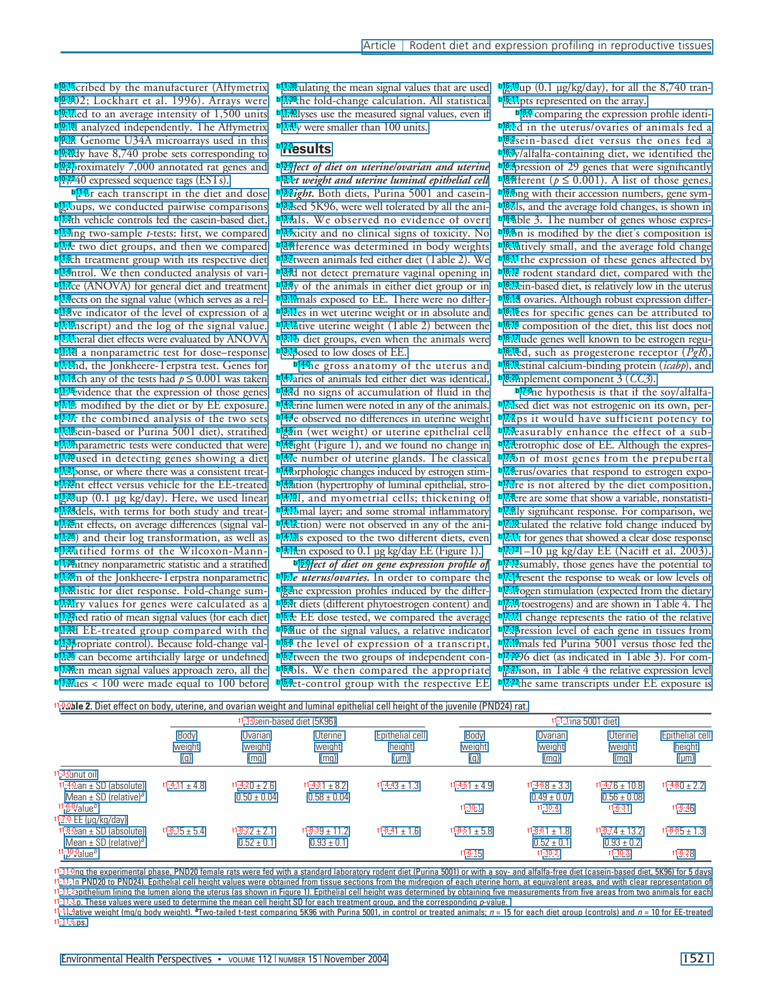

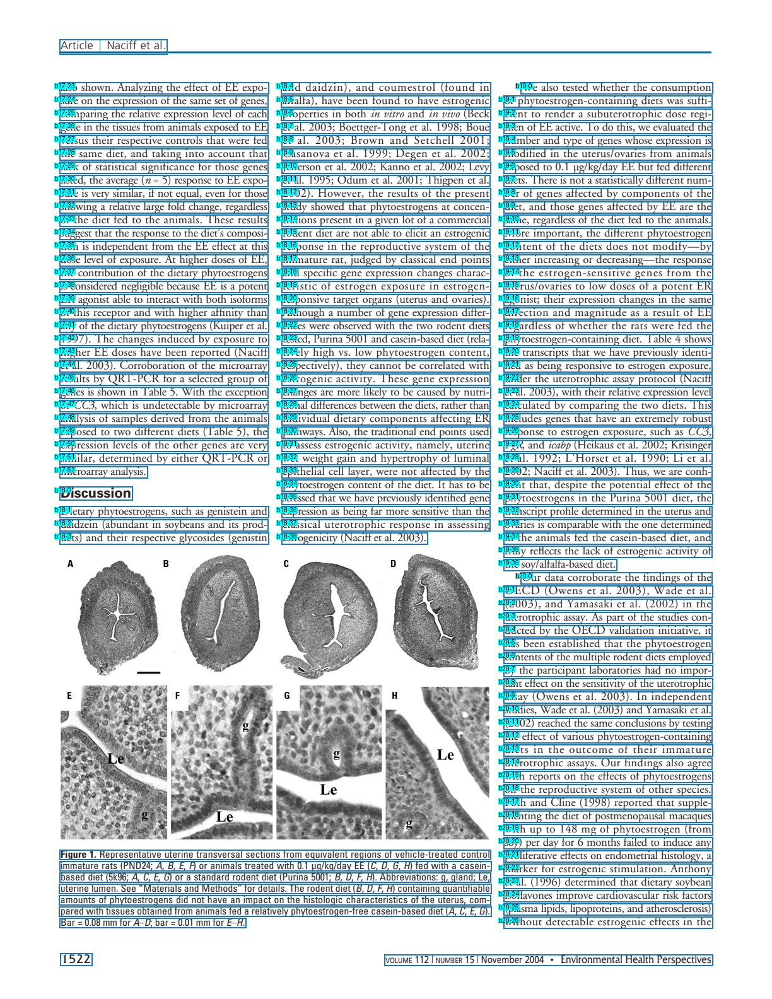

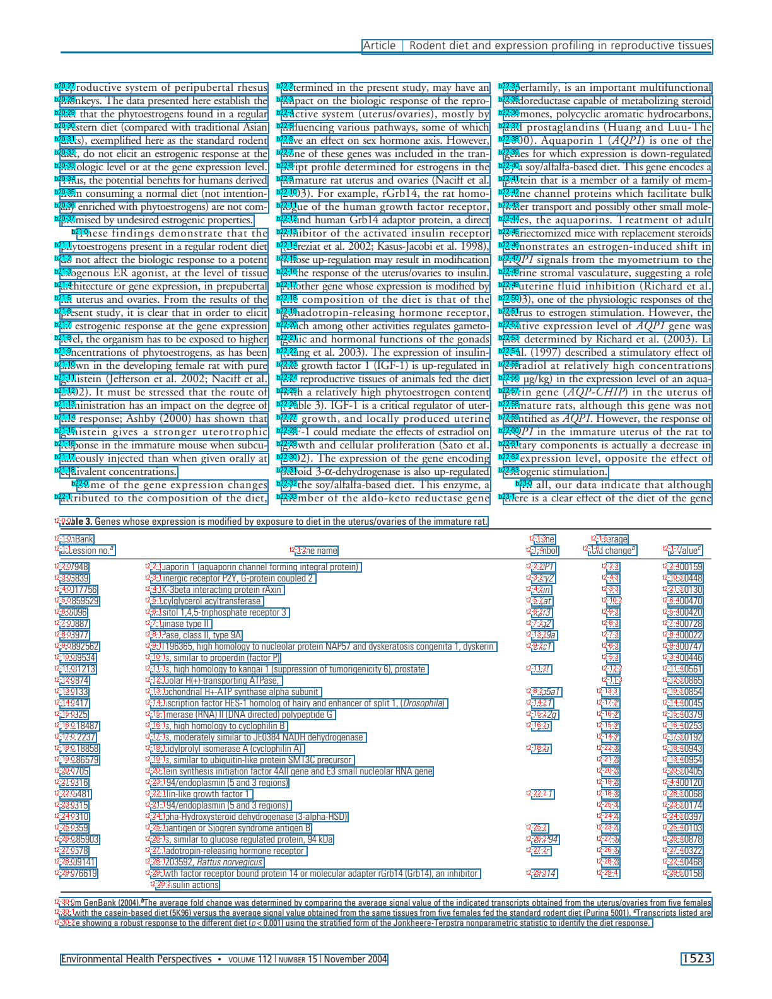

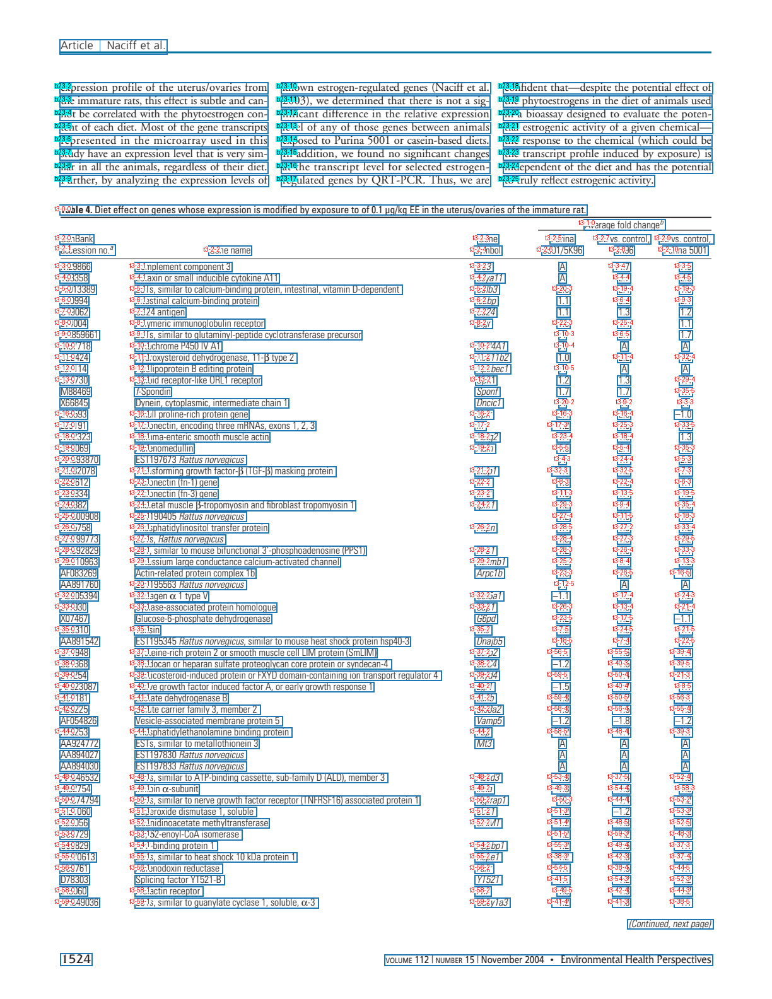

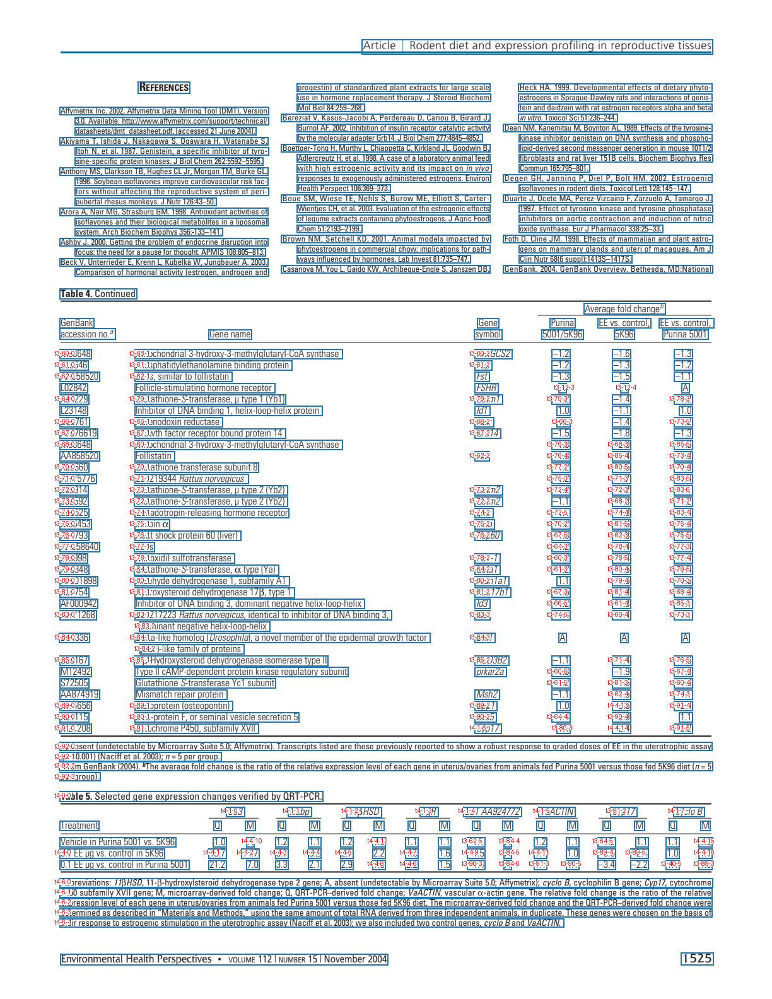

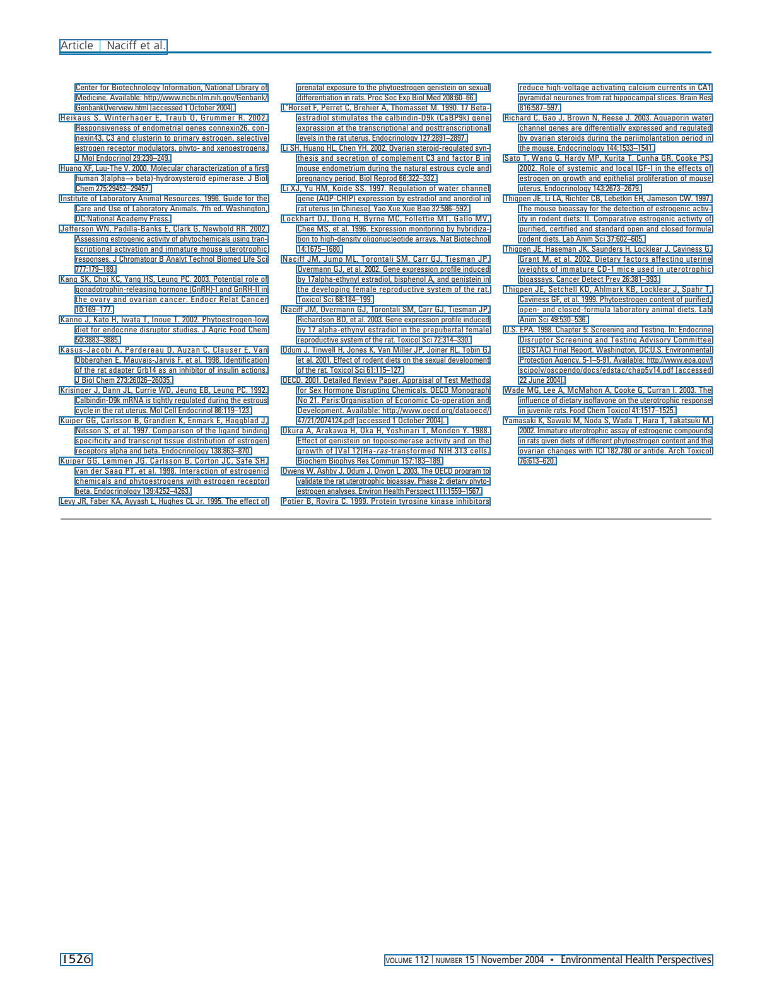

In [355]:
for page in show_annotations(doc.content, doc.content_boxes):
    display(page)